In [238]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
from dash import Dash, dcc, html
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
import seaborn as sns
from tqdm import tqdm
from sklearn.mixture import GaussianMixture
from scipy import linalg
from matplotlib.patches import Ellipse
from math import radians

from sklearn.metrics.pairwise import haversine_distances

from sklearn.preprocessing import MinMaxScaler, QuantileTransformer


import plotly.io as pio

pio.renderers.default = "plotly_mimetype+notebook"

In [3]:
df = pd.read_csv("../../data/Health_Facility_General_Information_20231025.csv")

In [4]:
blocks = pd.concat([pd.read_excel("../../data/manhattan_block_level.xlsx"), pd.read_excel("../../data/Brooklyn_block_level.xlsx")], ignore_index=True)

In [31]:
df["Facility Open Date"] = pd.to_datetime(df["Facility Open Date"])
df = df.sort_values(by="Facility Open Date")

df = df[
    df["Facility City"].isin(
        ["New York", "Brooklyn", "Bronx", "Staten Island", "Queens"]
    )
].reset_index(drop=True)

In [7]:
# color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(
    df,
    lat="Facility Latitude",
    lon="Facility Longitude",
    hover_name="Facility Name",
    # hover_data=["Address", "Listed"],
    # color="Listed",
    # color_continuous_scale=color_scale,
    # size="Listed",
    zoom=10,
    height=800,
    width=800,
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_geos(fitbounds="locations")
fig.show()

In [8]:
blocks

,COUNTYFP20,TRACTCE20,BLOCKCE20,ALAND20,INTPTLAT20,INTPTLON20,POP20
0,61,1401,1000,56638,40.715272,-73.988510,1852
1,61,2202,1002,12339,40.721345,-73.982524,332
2,61,12400,8001,16590,40.765399,-73.953385,618
3,61,10300,2000,23229,40.752456,-73.995126,756
4,61,10900,1003,21420,40.753185,-73.990886,209
...,...,...,...,...,...,...,...
13893,47,56301,1000,10967,40.734407,-73.959168,158
13894,47,56301,1001,11129,40.733704,-73.959059,167
13895,47,56301,2000,22576,40.736065,-73.956915,370
13896,47,56301,2001,22485,40.735356,-73.956800,669


In [11]:
blocks["geoid"] = blocks["COUNTYFP20"].astype(str) + blocks["TRACTCE20"].astype(str) + blocks["BLOCKCE20"].astype(str)

In [13]:
blocks["ALAND20"] = blocks["ALAND20"] / 10**6

In [15]:
# color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(
    blocks,
    lat="INTPTLAT20",
    lon="INTPTLON20",
    hover_name="geoid",
    # hover_data=["Address", "Listed"],
    color="POP20",
    # color_continuous_scale=color_scale,
    size="ALAND20",
    zoom=10,
    height=800,
    width=800,
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_geos(fitbounds="locations")
fig.show()

In [16]:
blocks["ALAND20"].hist(backend="plotly")

In [17]:
blocks[blocks["ALAND20"] < 0.1]["ALAND20"].hist(backend="plotly")

In [37]:
blocks["POP20"].hist(backend="plotly")

In [18]:
blocks[blocks["POP20"] > 0]["POP20"].hist(backend="plotly")

In [104]:
blocks_updated = blocks[
    (blocks["ALAND20"].between(0, 0.1, inclusive="neither"))
    & (blocks["POP20"] > 0)
].copy()

In [211]:
def get_population_r_squared(block, population_threshold):
    return population_threshold * block["ALAND20"] / block["POP20"]

In [25]:
def get_population_score(block, distance_threshold, population_radius_squared):
    
    distance_min_squared = min(population_radius_squared, distance_threshold ** 2)

    return 1 / distance_min_squared

In [21]:
def get_age_score(block, age_function):
    hospital_indicator = age_function(block["mean_age"])
    return hospital_indicator

In [281]:
def penalize_proximity_to_hospitals(block, hospital_locations, distance_threshold):
    block_location = np.array([block["INTPTLAT20"], block["INTPTLON20"]])
    hospital_locations = np.array(
        hospital_locations[["Facility Latitude", "Facility Longitude"]]
    )

    # distances = [(compute_haversine_distance(block_location, hospital)[0][1]**2 < distance_threshold) for hospital in hospital_locations]

    distances = [
        (compute_haversine_distance(block_location, hospital) ** 2 <= distance_threshold)
        for hospital in hospital_locations
    ]

    num_rows_less_than_threshold = np.sum(distances, axis=0)

    return num_rows_less_than_threshold

In [252]:
blocks_updated["tmp"] = blocks_updated.apply(lambda x: penalize_proximity_to_hospitals(x, df[:10], 1000), axis=1)

In [265]:
blocks_updated["population_radius_squared"] = blocks_updated.apply(
        lambda x: get_population_r_squared(
            x,
            1000,
        ),
        axis=1,
    )

In [266]:
blocks_updated

,COUNTYFP20,TRACTCE20,BLOCKCE20,ALAND20,INTPTLAT20,INTPTLON20,POP20,geoid,tmp,population_radius_squared
0,61,1401,1000,0.056638,40.715272,-73.988510,1852,6114011000,"[387.8219501192121, 391.9722314732619, 9.54816...",0.030582
1,61,2202,1002,0.012339,40.721345,-73.982524,332,6122021002,"[355.35791758130426, 359.7951647265691, 15.068...",0.037166
2,61,12400,8001,0.016590,40.765399,-73.953385,618,61124008001,"[180.6939505873066, 195.02707558185637, 87.250...",0.026845
3,61,10300,2000,0.023229,40.752456,-73.995126,756,61103002000,"[283.38194330214037, 312.91485674717677, 50.88...",0.030726
4,61,10900,1003,0.021420,40.753185,-73.990886,209,61109001003,"[273.19522334747677, 300.8407291246124, 52.318...",0.102488
...,...,...,...,...,...,...,...,...,...,...
13892,47,56302,2002,0.010822,40.735120,-73.959252,284,47563022002,"[272.1456957011142, 271.9443526822762, 37.4543...",0.038106
13893,47,56301,1000,0.010967,40.734407,-73.959168,158,47563011000,"[274.25209993260984, 273.5875680234238, 36.681...",0.069411
13894,47,56301,1001,0.011129,40.733704,-73.959059,167,47563011001,"[276.3062492247256, 275.1701526658563, 35.9456...",0.066641
13895,47,56301,2000,0.022576,40.736065,-73.956915,370,47563012000,"[265.8265833009792, 264.90366293977183, 39.867...",0.061016


In [276]:
blocks_updated["population_radius_squared"].describe()

count    10892.000000
mean         0.154675
std          1.038201
min          0.001466
25%          0.028660
50%          0.044984
75%          0.078463
max         52.819000
Name: population_radius_squared, dtype: float64

In [277]:
blocks_updated["tmp"].map(lambda x: min(x)).describe()

count    10892.000000
mean        12.463033
std         13.299224
min          0.000236
25%          3.187653
50%          7.586224
75%         17.400184
max         72.159292
Name: tmp, dtype: float64

<Axes: >

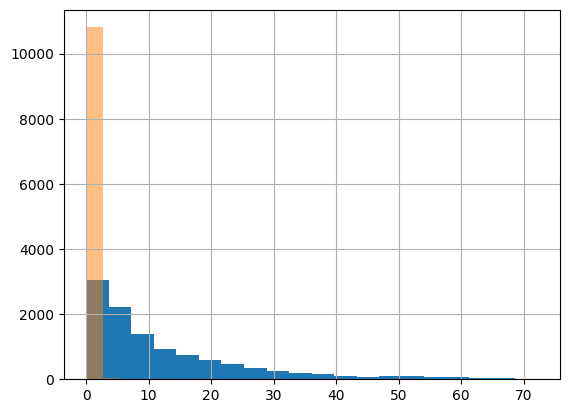

In [274]:
blocks_updated["tmp"].map(lambda x: min(x)).hist(bins=20)
blocks_updated["population_radius_squared"].hist(bins=20, alpha=0.5)

In [261]:
df[:10]

,Facility ID,Facility Name,Short Description,Description,Facility Open Date,Facility Address 1,Facility Address 2,Facility City,Facility State,Facility Zip Code,...,Cooperator Name,Cooperator Address,Cooperator Address 2,Cooperator City,Cooperator State,Cooperator Zip Code,Ownership Type,Facility Latitude,Facility Longitude,Facility Location
0,1245,Pelham Parkway Nursing Care and Rehabilitation...,NH,Residential Health Care Facility - SNF,1901-01-01,2401 Laconia Ave,NaN,Bronx,New York,10469,...,NaN,NaN,NaN,NaN,New York,NaN,LLC,40.861217,-73.855995,"(40.861217, -73.855995)"
1,1216,"Providence Rest, Inc.",NH,Residential Health Care Facility - SNF,1901-01-01,3304 Waterbury Avenue,NaN,Bronx,New York,10465,...,NaN,NaN,NaN,NaN,New York,NaN,Not for Profit Corporation,40.837490,-73.817528,"(40.83749, -73.817528)"
2,1381,"Cobble Hill Health Center, Inc",NH,Residential Health Care Facility - SNF,1901-01-01,380 Henry Street,NaN,Brooklyn,New York,11201,...,NaN,NaN,NaN,NaN,New York,NaN,Not for Profit Corporation,40.688328,-73.997482,"(40.688328, -73.997482)"
3,1516,The Door - A Center of Alternatives,DTC,Diagnostic and Treatment Center,1901-01-01,121 Ave of The Americas,NaN,New York,New York,10013,...,NaN,NaN,NaN,NaN,New York,NaN,Not for Profit Corporation,40.724056,-74.004700,"(40.724056, -74.0047)"
4,1249,Triboro Center for Rehabilitation and Nursing,NH,Residential Health Care Facility - SNF,1901-01-01,1160 Teller Ave,NaN,Bronx,New York,10456,...,NaN,NaN,NaN,NaN,New York,NaN,LLC,40.831406,-73.912041,"(40.831406, -73.912041)"
5,1469,Mount Sinai Morningside,HOSP,Hospital,1901-01-01,1111 Amsterdam Avenue,NaN,New York,New York,10025,...,"Mount Sinai Hospitals Group, Inc.",One Gustave L. Levy Place,NaN,New York,New York,10029.0,Not for Profit Corporation,40.805912,-73.961639,"(40.805912, -73.961639)"
6,1257,Wayne Center for Nursing & Rehabilitation,NH,Residential Health Care Facility - SNF,1901-01-01,3530 Wayne Avenue,NaN,Bronx,New York,10467,...,NaN,NaN,NaN,NaN,New York,NaN,LLC,40.881191,-73.877365,"(40.881191, -73.877365)"
7,1305,Maimonides Medical Center,HOSP,Hospital,1901-01-01,4802 Tenth Avenue,NaN,Brooklyn,New York,11219,...,NaN,NaN,NaN,NaN,New York,NaN,Not for Profit Corporation,40.639423,-73.998390,"(40.639423, -73.99839)"
8,1315,Kingsbrook Jewish Medical Center,HOSP,Hospital,1901-01-01,585 Schenectady Avenue,NaN,Brooklyn,New York,11203,...,"One Brooklyn Health System, Inc.",1 Brookdale Plaza,Care of Alex Rovt Chairman of the Board,Brooklyn,New York,11212.0,Not for Profit Corporation,40.659435,-73.934036,"(40.659435, -73.934036)"
9,1453,Memorial Hospital for Cancer and Allied Diseases,HOSP,Hospital,1901-01-01,1275 York Avenue,NaN,New York,New York,10065,...,NaN,NaN,NaN,NaN,New York,NaN,Not for Profit Corporation,40.764386,-73.956812,"(40.764386, -73.956812)"


In [90]:
def get_score(block, hospital_locations, distance_threshold, population_threshold, age_function, coefficients):
    population_radius_squared = get_population_r_squared(block, population_threshold)
    population_score = get_population_score(block, distance_threshold, population_radius_squared)
    # age_score = get_age_score(block, age_function)
    age_score = 0
    penalty = penalize_proximity_to_hospitals(block, hospital_locations, population_radius_squared)

    score = np.dot(coefficients, np.array([population_score, age_score, -penalty]))
    return score

In [241]:
def compute_haversine_distance(x, y):
    x_rad = [radians(_) for _ in x]
    y_rad = [radians(_) for _ in y]
    return haversine_distances([x_rad, y_rad])[0][1] * 6371000 / 1000

In [299]:
def loss_function(y_true, y_pred, time_delta):
    distances = []
    print(len(y_pred), len(y_true))
    for _, block in y_pred.iterrows():
        block_location = (block["Facility Latitude"], block["Facility Longitude"])
        nearest_hospital_distance = float("inf")
        y_true_valid = y_true[
            (y_true["Facility Open Date"] >= block["Facility Open Date"] - time_delta)
            & (y_true["Facility Open Date"] <= block["Facility Open Date"] + time_delta)
        ]

        for _, hospital in y_true_valid.iterrows():
            hospital_location = (
                hospital["Facility Latitude"],
                hospital["Facility Longitude"],
            )
            distance = compute_haversine_distance(block_location, hospital_location)

            if distance < nearest_hospital_distance:
                nearest_hospital_distance = distance
        distances.append(nearest_hospital_distance)

    mean_distance = sum(distances) / len(distances)
    return mean_distance

In [330]:
def build_hospital(
    all_blocks,
    hospital_locations,
    distance_threshold,
    population_threshold,
    age_function,
    coefficients
):
    blocks = all_blocks.copy()
    # blocks["score"] = blocks.apply(
    #     lambda x: get_score(
    #         x,
    #         hospital_locations,
    #         distance_threshold,
    #         population_threshold,
    #         age_function,
    #         coefficients,
    #     ),
    #     axis=1,
    # )

    blocks["population_radius_squared"] = blocks.apply(
            lambda x: get_population_r_squared(
                x,
                population_threshold,
            ),
            axis=1,
        )

    blocks["population_score"] = blocks.apply(
            lambda x: get_population_score(
                x,
                distance_threshold,
                x["population_radius_squared"],
            ),
            axis=1,
        )

    blocks["penalty"] = blocks.apply(
            lambda x: penalize_proximity_to_hospitals(
                x,
                hospital_locations,
                x["population_radius_squared"],
            ),
            axis=1,
        )

    # blocks["age_score"] = blocks.apply(lambda x: get_age_score(x, age_function), axis=1)
    blocks["age_score"] = 0

    blocks[["population_score", "penalty", "age_score"]] = MinMaxScaler().fit_transform(blocks[["population_score", "penalty", "age_score"]])

    blocks["score"] = np.dot(coefficients, blocks[["population_score", "age_score", "penalty"]].to_numpy().T)
    # display(blocks)

    # blocks["score"].hist(bins=100, label="score")
    # blocks["population_score"].hist(bins=100, label="population_score")
    # blocks["age_score"].hist(bins=100, label="age_score")
    # blocks["penalty"].hist(bins=100, label="penalty")

    blocks["score"] = MinMaxScaler().fit_transform(QuantileTransformer(output_distribution="normal").fit_transform(blocks["score"].to_numpy().reshape(-1, 1)))
    # blocks["score"].hist(bins=100, label="scaled_score")
    # plt.legend()
    # plt.show()

    # fig = px.scatter_mapbox(
    #     blocks,
    #     lat="INTPTLAT20",
    #     lon="INTPTLON20",
    #     hover_name="BLOCKCE20",
    #     # hover_data=["Address", "Listed"],
    #     color="score",
    #     # color_continuous_scale=color_scale,
    #     # size="Listed",
    #     zoom=10,
    #     height=400,
    #     width=400,
    # )

    # fig.update_layout(mapbox_style="open-street-map")
    # fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    # fig.update_geos(fitbounds="locations")
    # fig.show()

    hospital_location = blocks.loc[
        blocks["score"].idxmax(), ["INTPTLAT20", "INTPTLON20"]
    ].values

    # display(blocks)
    # print("-------------------")

    return hospital_location, blocks["score"].max()

In [350]:
START_YEAR = pd.to_datetime("1990-01-01")
CURRENT_YEAR = pd.to_datetime("1995-01-01")
END_YEAR = pd.to_datetime("1997-01-01")

DATA_SET_START = df["Facility Open Date"].min()
DATA_SET_END = START_YEAR

TOTAL_HOSPITALS = len(df)
PROXIMITY_TIME_DELTA = pd.Timedelta(days=365 * 50)
inter_build_time = pd.Timedelta(days=(DATA_SET_END - DATA_SET_START).days / TOTAL_HOSPITALS)

def age_function(x):
    return (x + 5) ** 2 + 3

distance_threshold = 5
population_threshold = 1000
coefficients = np.array([0.3, 0.3, -0.3])

In [328]:
def simulate_hospital_building(
    blocks,
    distance_threshold,
    population_threshold,
    age_function,
    coefficients,
    START_YEAR,
    CURRENT_YEAR,
    END_YEAR,
    inter_build_time,
    PROXIMITY_TIME_DELTA,
):
    hospitals = (
        df[
            (df["Facility Open Date"] >= START_YEAR)
            & (df["Facility Open Date"] <= CURRENT_YEAR)
        ]
        .dropna(subset=["Facility Latitude", "Facility Longitude"])
        .copy()
    )
    loss = []
    scores = []

    try:
        while CURRENT_YEAR < END_YEAR:
            print("Num Hospitals: ", len(hospitals))
            CURRENT_YEAR += inter_build_time

            hospital_location, score = build_hospital(
                blocks,
                hospitals,
                distance_threshold,
                population_threshold,
                age_function,
                coefficients,
            )

            print(hospital_location, score)

            hospitals = pd.concat(
                [
                    hospitals,
                    pd.DataFrame(
                        {
                            "Facility Name": "Hospital " + str(len(hospitals) + 1),
                            "Facility Open Date": CURRENT_YEAR,
                            "Facility Latitude": hospital_location[0],
                            "Facility Longitude": hospital_location[1],
                        },
                        index=[0],
                        columns=hospitals.columns,
                    ),
                ],
                ignore_index=True,
            )

            scores.append(score)
            loss.append(
                loss_function(
                    df[
                        (df["Facility Open Date"] >= START_YEAR)
                        & (df["Facility Open Date"] <= CURRENT_YEAR)
                    ].dropna(subset=["Facility Latitude", "Facility Longitude"]),
                    hospitals,
                    PROXIMITY_TIME_DELTA,
                )
            )

    except KeyboardInterrupt:
        return hospitals, loss, scores

    return hospitals, loss, scores

In [351]:
generated_hospitals, loss_values, scores = simulate_hospital_building(
    blocks_updated.sample(100),
    distance_threshold,
    population_threshold,
    age_function,
    coefficients,
    START_YEAR,
    CURRENT_YEAR,
    END_YEAR,
    inter_build_time,
    PROXIMITY_TIME_DELTA
)

Num Hospitals:  124


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7096739 -74.0077502] 1.0
125 125
Num Hospitals:  125
[40.7796469 -73.9544011] 1.0
126 127


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  126
[40.7515678 -73.9693935] 1.0
127 127


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  127
[40.7313489 -73.9761957] 1.0
128 129


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  128
[40.7764716 -73.9776191] 1.0
129 130


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  129


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.8003962 -73.9587151] 1.0
130 130
Num Hospitals:  130


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7937975 -73.9686872] 1.0
131 137
Num Hospitals:  131


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.6220994 -73.9385175] 1.0
132 137
Num Hospitals:  132


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7865505 -73.9536037] 1.0
133 138
Num Hospitals:  133
[40.7317375 -74.0022682] 1.0
134 138


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  134


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.6533118 -73.9610936] 1.0
135 143
Num Hospitals:  135
[40.6384872 -74.0226807] 1.0
136 143


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  136
[40.7857258 -73.9793716] 1.0
137 146


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  137
[40.8422902 -73.9379566] 1.0
138 148


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  138


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7519068 -73.9721539] 1.0
139 149
Num Hospitals:  139
[40.7543231 -73.9643028] 1.0
140 151


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  140
[40.8684837 -73.9228824] 1.0
141 153


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  141


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7209832 -73.9845737] 1.0
142 153
Num Hospitals:  142


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7628292 -73.9666993] 1.0
143 153
Num Hospitals:  143


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7670929 -73.9633956] 1.0
144 156
Num Hospitals:  144


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.6387075 -73.9865095] 1.0
145 157
Num Hospitals:  145


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.6761675 -73.9151194] 1.0
146 159
Num Hospitals:  146
[40.7723523 -73.9597505] 1.0
147 160


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  147


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7003983 -73.9189734] 1.0
148 161
Num Hospitals:  148


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7021834 -73.9499496] 1.0
149 164
Num Hospitals:  149


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7044536 -73.9340077] 1.0
150 164
Num Hospitals:  150


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.6822437 -73.881876] 1.0
151 166
Num Hospitals:  151


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.6303703 -73.99875] 1.0
152 167
Num Hospitals:  152


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.582207 -73.9605507] 1.0
153 169
Num Hospitals:  153


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.8706233 -73.9155814] 1.0
154 170
Num Hospitals:  154


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7104794 -73.9445767] 1.0
155 173
Num Hospitals:  155


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7052603 -73.9420028] 1.0
156 175
Num Hospitals:  156


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.6382101 -73.9905983] 1.0
157 180
Num Hospitals:  157


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.5932983 -73.9567711] 1.0
158 182
Num Hospitals:  158


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7353559 -73.9567998] 1.0
159 183
Num Hospitals:  159


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.8554298 -73.9323379] 1.0
160 185
Num Hospitals:  160


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.64371 -73.9512259] 1.0
161 186
Num Hospitals:  161
[40.7096739 -74.0077502] 1.0
162 190


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Num Hospitals:  162


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7796469 -73.9544011] 1.0
163 191
Num Hospitals:  163


/Users/polaris000/Library/Python/3.9/lib/python/site-packages/sklearn/preprocessing/_data.py:2667: UserWarning:

n_quantiles (1000) is greater than the total number of samples (100). n_quantiles is set to n_samples.

/var/folders/my/m5k3cyhd3p75zf8vjt23jfdw0000gn/T/ipykernel_45380/13776623.py:40: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



[40.7515678 -73.9693935] 1.0
164 191


In [357]:
px.line(loss_values, title="Loss", labels={"index": "Year", "value": "Loss"}).update_layout(showlegend=False)

In [353]:
fig = px.scatter_mapbox(
    generated_hospitals,
    lat="Facility Latitude",
    lon="Facility Longitude",
    hover_name="Facility Name",
    zoom=10,
    height=800,
    width=800,
)

y_pred_after_current_date = generated_hospitals[generated_hospitals["Facility Open Date"] > CURRENT_YEAR]
y_true_after_current_date = df[(df["Facility Open Date"] > CURRENT_YEAR) & (df["Facility Open Date"] < END_YEAR)]

fig.add_trace(
    px.scatter_mapbox(
        y_pred_after_current_date,
        lat="Facility Latitude",
        lon="Facility Longitude",
        hover_name="Facility Name",
    ).update_traces(marker=dict(color="red", size=10)).data[0]
)

fig.add_trace(
    px.scatter_mapbox(
        y_true_after_current_date,
        lat="Facility Latitude",
        lon="Facility Longitude",
        hover_name="Facility Name",
    ).update_traces(marker=dict(color="green", size=10)).data[0]
)

# Update layout and style
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_geos(fitbounds="locations")


fig.show()

In [331]:
px.line(loss_values)

In [315]:
px.line(loss_values)

In [336]:
fig = px.scatter_mapbox(
    generated_hospitals,
    lat="Facility Latitude",
    lon="Facility Longitude",
    hover_name="Facility Name",
    zoom=10,
    height=800,
    width=800,
)

after_current_date = generated_hospitals[generated_hospitals["Facility Open Date"] > CURRENT_YEAR]

fig.add_trace(
    px.scatter_mapbox(
        after_current_date,
        lat="Facility Latitude",
        lon="Facility Longitude",
        hover_name="Facility Name",
    ).update_traces(marker=dict(color="red", size=10)).data[0]
)

# Update layout and style
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_geos(fitbounds="locations")


fig.show()

In [334]:
# Create a new scatter mapbox plot
fig = px.scatter_mapbox(
    generated_hospitals,
    lat="Facility Latitude",
    lon="Facility Longitude",
    hover_name="Facility Name",
    zoom=10,
    height=800,
    width=800,
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_geos(fitbounds="locations")
fig.show()


In [138]:
blocks_updated["score"].hist(backend="plotly")

In [106]:
((blocks_updated["score"] - blocks_updated["score"].min()) / (blocks_updated["score"].max() - blocks_updated["score"].min())).describe()

count    10892.000000
mean         0.002848
std          0.012210
min          0.000000
25%          0.000349
50%          0.001063
75%          0.002618
max          1.000000
Name: score, dtype: float64

In [139]:
blocks_updated["score_norm"] = ((blocks_updated["score"] - blocks_updated["score"].min()) / (blocks_updated["score"].max() - blocks_updated["score"].min()))

In [140]:
blocks_updated["score_norm"].hist(backend="plotly")

In [141]:
# color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(
    blocks_updated,
    lat="INTPTLAT20",
    lon="INTPTLON20",
    hover_name="BLOCKCE20",
    # hover_data=["Address", "Listed"],
    color="score_norm",
    # color_continuous_scale=color_scale,
    # size="Listed",
    zoom=10,
    height=800,
    width=800,
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_geos(fitbounds="locations")
fig.show()

In [142]:
blocks_updated["score_quant_transformed"] = MinMaxScaler().fit_transform(QuantileTransformer(output_distribution="normal").fit_transform(blocks_updated[["score_norm"]]))

In [143]:
blocks_updated["score_quant_transformed"].hist(backend="plotly")

In [144]:
# color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(
    blocks_updated,
    lat="INTPTLAT20",
    lon="INTPTLON20",
    hover_name="BLOCKCE20",
    # hover_data=["Address", "Listed"],
    color="score_quant_transformed",
    # color_continuous_scale=color_scale,
    # size="Listed",
    zoom=10,
    height=800,
    width=800,
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_geos(fitbounds="locations")
fig.show()